## Prediction of Hotel Booking Cancellation

### EDA

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, confusion_matrix, auc
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import LabelEncoder, StandardScaler 
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from warnings import filterwarnings
filterwarnings('ignore')
data = pd.read_csv('hotel_bookings.csv')
data.describe()

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


ModuleNotFoundError: No module named 'xgboost'

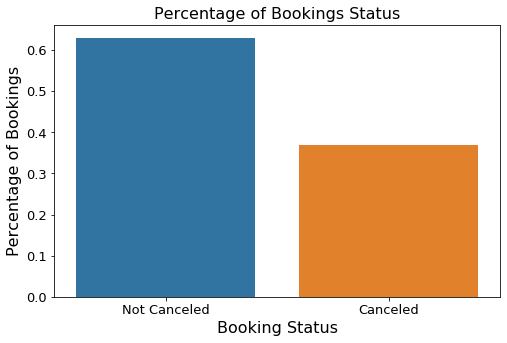

In [4]:
font = {'color':  'black',
        'weight': 'normal',
        'size': 16
        
        }
plt.figure(figsize=(8,5)) 
plt.title("Percentage of Bookings Status", fontdict=font)
sns.barplot(x=data['is_canceled'].unique(), y=data['is_canceled'].value_counts(normalize=True))
plt.xlabel("Booking Status", fontdict=font)
plt.ylabel("Percentage of Bookings", fontdict=font)
plt.yticks(fontsize=13)
plt.xticks(ticks=[0, 1], labels=['Not Canceled', 'Canceled'],fontsize=13);

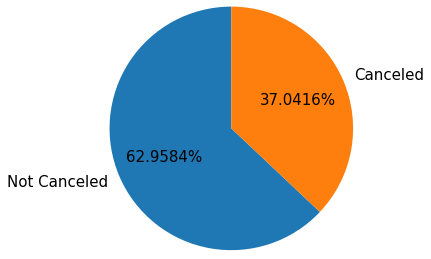

In [5]:
fig1, ax1 = plt.subplots()
ax1.pie(data['is_canceled'].value_counts(normalize=True),labels=['Not Canceled', 'Canceled'], autopct='%0.4f%%',
         startangle=90,radius = 1.4,textprops = {"fontsize":15}) 
plt.show()

In [6]:
rs = np.random.RandomState(0)
df = pd.DataFrame(data)
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm')
# 'RdBu_r', 'BrBG_r', & PuOr_r are other good diverging colormaps

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
is_canceled,1.000000,0.293123,0.016660,0.008148,-0.006130,-0.001791,0.024765,0.060017,0.005048,-0.032491,-0.084793,0.110133,-0.057358,-0.144381,-0.083114,-0.020642,0.054186,0.047557,-0.195498,-0.234658
lead_time,0.293123,1.000000,0.040142,0.126871,0.002268,0.085671,0.165799,0.119519,-0.037622,-0.020915,-0.124410,0.086042,-0.073548,0.000149,-0.069741,0.151464,0.170084,-0.063077,-0.116451,-0.095712
arrival_date_year,0.016660,0.040142,1.000000,-0.540561,-0.000221,0.021497,0.030883,0.029635,0.054624,-0.013192,0.010341,-0.119822,0.029218,0.030872,0.063457,0.259095,-0.056497,0.197580,-0.013684,0.108531
arrival_date_week_number,0.008148,0.126871,-0.540561,1.000000,0.066809,0.018208,0.015558,0.025909,0.005518,0.010395,-0.030131,0.035501,-0.020904,0.005508,-0.031201,-0.076760,0.022933,0.075791,0.001920,0.026149
arrival_date_day_of_month,-0.006130,0.002268,-0.000221,0.066809,1.000000,-0.016354,-0.028174,-0.001566,0.014544,-0.000230,-0.006145,-0.027011,-0.000300,0.010613,0.001487,0.044858,0.022728,0.030245,0.008683,0.003062
stays_in_weekend_nights,-0.001791,0.085671,0.021497,0.018208,-0.016354,1.000000,0.498969,0.091871,0.045793,0.018483,-0.087239,-0.012775,-0.042715,0.063281,0.140739,0.066749,-0.054151,0.049342,-0.018554,0.072671
stays_in_week_nights,0.024765,0.165799,0.030883,0.015558,-0.028174,0.498969,1.000000,0.092976,0.044203,0.020191,-0.097245,-0.013992,-0.048743,0.096209,0.182382,0.182211,-0.002020,0.065237,-0.024859,0.068192
adults,0.060017,0.119519,0.029635,0.025909,-0.001566,0.091871,0.092976,1.000000,0.030447,0.018146,-0.146426,-0.006738,-0.107983,-0.051673,-0.035594,0.207793,-0.008283,0.230641,0.014785,0.122884
children,0.005048,-0.037622,0.054624,0.005518,0.014544,0.045793,0.044203,0.030447,1.000000,0.024030,-0.032859,-0.024730,-0.021072,0.048949,0.041066,0.030931,-0.033273,0.324854,0.056253,0.081745
babies,-0.032491,-0.020915,-0.013192,0.010395,-0.000230,0.018483,0.020191,0.018146,0.024030,1.000000,-0.008943,-0.007501,-0.006550,0.083440,0.036184,0.019206,-0.010621,0.029186,0.037383,0.097889


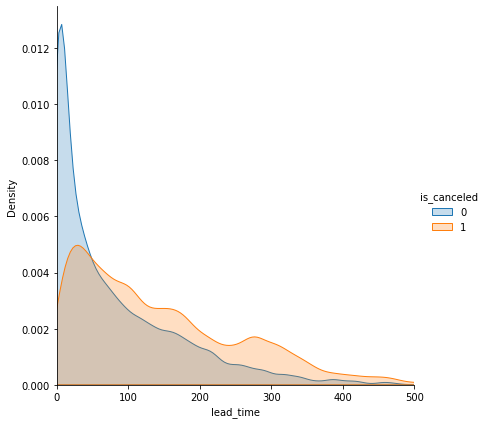

In [7]:
(sns.FacetGrid(data, hue = 'is_canceled',
             height = 6,
             xlim = (0,500))
    .map(sns.kdeplot, 'lead_time', shade = True)
    .add_legend());

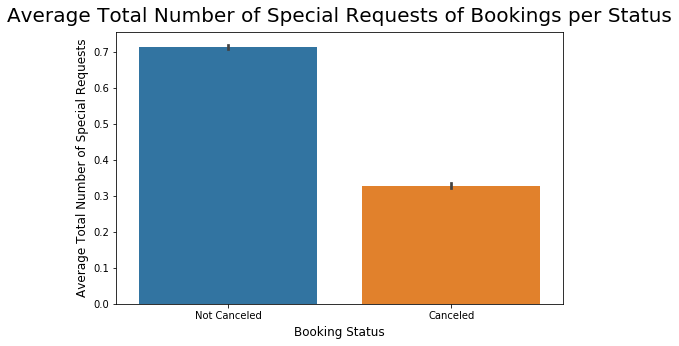

In [8]:
# Visualizing the total number of special requests for canceled and not canceled bookings:
plt.figure(figsize=(8,5)) 
plt.title("Average Total Number of Special Requests of Bookings per Status", fontsize = 20, pad = 10)
sns.barplot(x=data['is_canceled'], y=data['total_of_special_requests'])
plt.xlabel("Booking Status", fontsize = 12, labelpad = 5)
plt.ylabel("Average Total Number of Special Requests", fontsize = 12, labelpad = 5)
plt.xticks(ticks=[0, 1], labels=['Not Canceled', 'Canceled']);

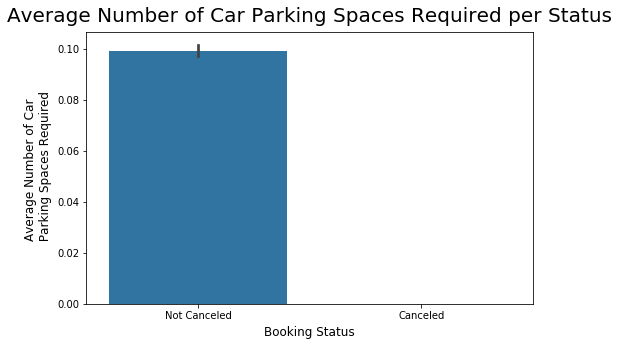

In [9]:
# Visualizing the total number of requested parking spaces for canceled and not canceled bookings:
plt.figure(figsize=(8,5)) 
plt.title("Average Number of Car Parking Spaces Required per Status", fontsize = 20, pad = 10)
sns.barplot(x=data['is_canceled'], y=data['required_car_parking_spaces'])
plt.xlabel("Booking Status", fontsize = 12, labelpad = 5)
plt.ylabel("Average Number of Car \n Parking Spaces Required", fontsize = 12, labelpad = 5)
plt.xticks(ticks=[0, 1], labels=['Not Canceled', 'Canceled']);

In [10]:
df =data.drop('reservation_status',axis=1)
df['is_canceled']=df['is_canceled'].replace([0,1],["no","yes"])
#Extracting categorical feature columns
cols = df.columns
num_cols = df._get_numeric_data().columns
cat_cols=list(set(cols) - set(num_cols))
df_cat=df[cat_cols]
df_cat.columns

Index(['meal', 'hotel', 'reservation_status_date', 'market_segment',
       'deposit_type', 'distribution_channel', 'is_canceled',
       'assigned_room_type', 'customer_type', 'reserved_room_type',
       'arrival_date_month', 'country'],
      dtype='object')

In [11]:
df = data
df['is_canceled']=df['is_canceled'].replace([0,1],["no","yes"])
#Extracting categorical feature columns
cols = df.columns
num_cols = df._get_numeric_data().columns
cat_cols=list(set(cols) - set(num_cols))
df_cat=df[cat_cols]
df_cat.columns

Index(['meal', 'hotel', 'reservation_status_date', 'market_segment',
       'deposit_type', 'distribution_channel', 'reservation_status',
       'is_canceled', 'assigned_room_type', 'customer_type',
       'reserved_room_type', 'arrival_date_month', 'country'],
      dtype='object')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:46: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


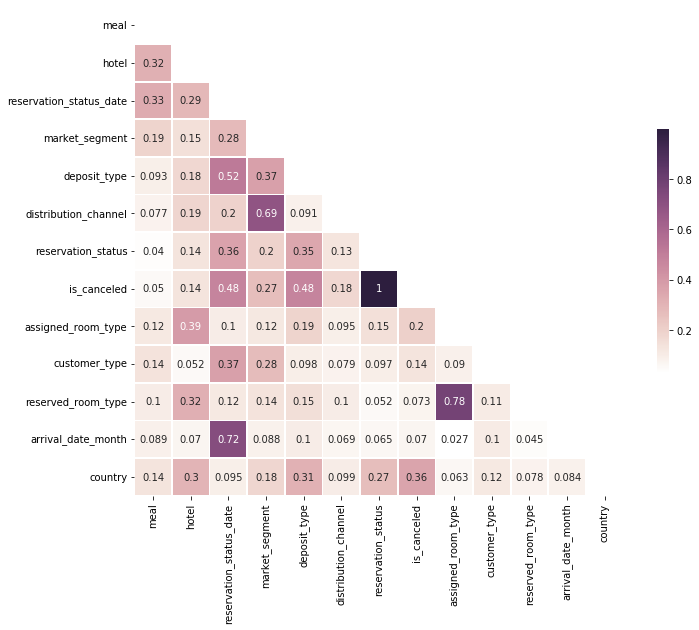

In [12]:
import itertools
import scipy

def cramers_corrected_stat(confusion_matrix):
    """
    Calculates the corrected Cramer's V statistic
    
    Args:
        confusion_matrix: The confusion matrix of the variables to calculate the statistic on
    
    Returns:
        The corrected Cramer's V statistic
    """
    
    #chi2, _, _, _ = scipy.stats.chi2_contingency(confusion_matrix)
    chi2 = scipy.stats.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

#Getting the list of columns in the dataframe
cols = list(df_cat.columns.values)

#Creating an empty array to append to as we will go through iteratations to calculate correlations of every combination of variables.
emp_arr = np.zeros((len(cols),len(cols)))

#Iteraiting dataframe using itertools
#itertools.combinations() : Given an array of size n, generate and print all possible combinations of r elements in array.
for col1, col2 in itertools.combinations(cols, 2):
    A, B = df_cat[col1], df_cat[col2]
    idx1, idx2 = cols.index(col1), cols.index(col2)
    conf_mat = pd.crosstab(A,B) 
    #appending results to emp_array
    emp_arr[idx1, idx2] = cramers_corrected_stat(conf_mat.values)
    emp_arr[idx2, idx1] = emp_arr[idx1, idx2]

#creating a correlation matrix
corr = pd.DataFrame(emp_arr, index=cols, columns=cols)

# Mask to get lower triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

cmap = sns.cubehelix_palette(light=1, as_cmap=True)

# Draw the heatmap with the mask 
fig = plt.figure(figsize=(12, 9))

sns.heatmap(corr, mask=mask, cmap=cmap, square=True, linewidths=.7,cbar_kws={"shrink": .5}, annot=True)

plt.show()

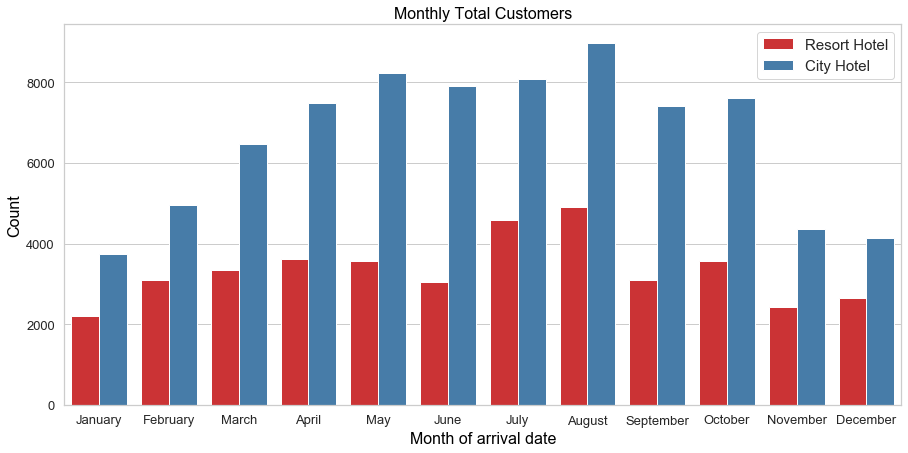

In [15]:
font = {'color':  'black',
        'weight': 'normal',
        'size': 16,
        }
ordered_months = ["January", "February", "March", "April", "May", "June", 
          "July", "August", "September", "October", "November", "December"]
data["arrival_date_month"] = pd.Categorical(data["arrival_date_month"], categories=ordered_months, ordered=True)
plt.figure(figsize =(15,7))
sns.set(style="whitegrid")
plt.title("Monthly Total Customers",fontdict=font)
ax = sns.countplot(x = "arrival_date_month", hue = 'hotel', data = data, palette = "Set1")
plt.xlabel('Month of arrival date',fontdict=font)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylabel('Count',fontdict=font)
plt.legend(loc=1, prop={'size': 15})

### Data preprocessing

In [21]:
from sklearn import preprocessing
'''Import and Preprocessing'''
raw = pd.read_csv('hotel_bookings.csv')
#%%
'''Check the n/a values'''
data = raw

na_summary = data.isna().sum()
na_summary.to_frame()

'''Drop n/a values'''
''''agent' and 'company' are just IDs and 'company' contains a large
amount of n/a values. Remove them directly.
'''
variables_to_drop = ['agent','company']
data = data.drop(variables_to_drop, axis = 1)
data = data.dropna()
data.isna().sum()

'''A Manual encoder'''

'''(1)Factorize hotel: RH = 0, CH = 1'''
data['hotel'] = data['hotel'].map({'Resort Hotel': 0,\
     'City Hotel': 1})

'''(2)Factorize month'''
data['arrival_date_month'] = \
    data['arrival_date_month'].map({\
        'January':1, 'February': 2, 'March':3, 'April':4, \
            'May':5, 'June':6, 'July':7,'August':8, 'September':9, \
                'October':10, 'November':11, 'December':12})

'''(3)Factorize 'meal': BB = 0, FB = 1, HB = 2, SC = 3
Count the number of each type before factorization.'''
meal_ratio = data['meal'].value_counts()
meal_table = pd.DataFrame(100*meal_ratio/meal_ratio.sum())
data = data.drop(data.index[data['meal'] == 'Undefined'])
data['meal'] = data['meal'].map({'BB':0, 'FB':1, 'HB':2, 'SC':3})


'''(4)Factorize 'distribution_channel': Direct = 0, Corporate = 1,
TA/TO = 2, GDS = 3'''
'''
Direct: Direct website bookings
Corporate: Companies that are corporate clients of the hotel have access
    to special discounts and benefits.
TA/TO: Third-party entities like travel agencies/operators. They may charge
    commission fees.
GDS: Global distribution system is owned by a company.
'''
dc_ratio = data['distribution_channel'].value_counts()
dc_table = pd.DataFrame(100*dc_ratio/dc_ratio.sum())
data = data.drop(\
    data.index[data['distribution_channel'] == 'Undefined'])

data['distribution_channel'] = data['distribution_channel'].map({\
    'Direct':0, 'Corportae':1, 'TA/TO':2, 'GDS':3
    })

'''(5)Factorize 'market_segment': Online TA: 0, Offline TA/TO = 1, Groups = 2,
Direct = 3, Corporate = 4, Complementary = 5, Aviation = 6
'''
'''
Probably the type of the hotel?
'''
ms_ratio = raw['market_segment'].value_counts()
ms_table = pd.DataFrame(100*ms_ratio/ms_ratio.sum())

data = data.drop(\
    data.index[data['market_segment'] == 'Undefined'])
data['market_segment'] = data['market_segment'].map({\
    'Online TA':0, 'Offline TA/TO':1, 'Groups':2, 'Direct':3, 'Corporate':4,\
        'Complementary':5, 'Aviation':6
    })

'''(6)Factorize 'deposit_type': No deposit: 0, Refundable: 1, NonRefund:2'''
data['deposit_type'] = data['deposit_type'].map({\
    'No Deposit':0, 'Refundable':1, 'Non Refund':2})

'''(7)Factorize 'reserved_room_type' in alphabetical order. The letters are
used for anonymity reasons so they are meaningless'''

room_type_ratio = data['reserved_room_type'].value_counts()
room_type_table = pd.DataFrame(100*room_type_ratio/room_type_ratio.sum())

# reserved_room_type = data['reserved_room_type']
# le = preprocessing.LabelEncoder()
# reserved_room_type = le.fit_transform(reserved_room_type)
data['reserved_room_type'] = data['reserved_room_type'].map({\
    'A':0,'B':1,'C':2,'D':3,'E':4,'F':5,'G':6,'H':7,'I':8,'K':9,'L':10,\
        'P':11})

'''(8)Factorize 'assigned_room_type' in alphabetical order.'''
room_type_ratio = data['reserved_room_type'].value_counts()
room_type_table = pd.DataFrame(100*room_type_ratio/room_type_ratio.sum())

data['assigned_room_type'] = data['assigned_room_type'].map({\
    'A':0,'B':1,'C':2,'D':3,'E':4,'F':5,'G':6,'H':7,'I':8,'K':9,'L':10,\
        'P':11})

'''(9)Factorize 'customer_type'
Transient: Walk-in/Last-minute/Short-stay individuals.
Transient-party: Assume to be similar to connecting flights.
Group: Group guests.
'''
customer_type_ratio = data['customer_type'].value_counts()
customer_type_table = \
    pd.DataFrame(100*customer_type_ratio/customer_type_ratio.sum())

data['customer_type'] = data['customer_type'].map({\
    'Transient':0, 'Transient-Party':1,'Contract':2,'Group':3})

'''(10)Factorize 'reservation_status'
Canceled:0, Check-Out:1, No-Show:2'''
le = preprocessing.LabelEncoder()
data['reservation_status'] = le.fit_transform(data['reservation_status'])


### Logistic regression

In [23]:
df = pd.read_csv("cleaned_data.csv")

In [24]:
X = pd.concat([df.iloc[:,0], df.iloc[:, 2:23]], axis = 1)
# X = df[['hotel', 'lead_time', 'adr', 'total_of_special_requests', 'required_car_parking_spaces',
#         'customer_type', 'days_in_waiting_list', 'booking_changes', 'room_type_change']]

y = df[['is_canceled']]

In [25]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 208)
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

LR = LogisticRegression(C = 3.5)
LR.fit(X_train, y_train)
y_predict_LR = LR.predict(X_test)
cm_LR = confusion_matrix(y_test, y_predict_LR)
cm_LR, np.sum(np.diagonal(cm_LR))/ np.sum(cm_LR)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


(array([[13315,  1660],
        [ 4086,  4686]]), 0.7580325935907694)

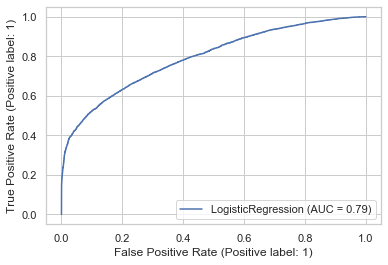

In [26]:
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_estimator(LR, X_test, y_test)

In [27]:
y_prob_LR = LR.predict_proba(X_test)

### KNN

In [28]:
from sklearn.neighbors import KNeighborsClassifier

KN = KNeighborsClassifier()
parameters_KN = {'n_neighbors':[100, 500, 1000]}
clf_KN = GridSearchCV(KN, parameters_KN)
clf_KN.fit(X_train, y_train)
y_predict_KN = clf_KN.predict(X_test)
cm_KN = confusion_matrix(y_test, y_predict_KN)
cm_KN, np.sum(np.diagonal(cm_KN))/ np.sum(cm_KN), clf_KN.best_estimator_

/opt/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sam

(array([[14778,   197],
        [ 3973,  4799]]),
 0.824398871436392,
 KNeighborsClassifier(n_neighbors=100))

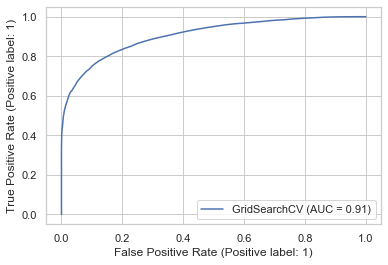

In [29]:
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_estimator(clf_KN, X_test, y_test)
y_prob_KN = clf_KN.predict_proba(X_test)

### SVM

In [30]:
from sklearn.svm import SVC

SVM = SVC(probability=True)
SVM.fit(X_train, y_train)
y_predict_SVM = SVM.predict(X_test)
cm_SVM = confusion_matrix(y_test, y_predict_SVM)
cm_SVM, np.sum(np.diagonal(cm_SVM))/ np.sum(cm_SVM)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


(array([[14975,     0],
        [ 8772,     0]]), 0.6306059712805828)

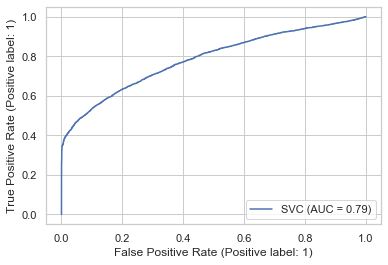

In [31]:
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_estimator(SVM, X_test, y_test)

In [32]:
y_prob_SVM = SVM.predict_proba(X_test)

### Decision Tree

In [33]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
# Construct Grid Parameters
dt_params = {
    'max_depth':[None],
    'max_features' : np.linspace(0,1,11),
    'min_samples_split': range(20,30), 
    'min_samples_leaf': range(1,5)
}

# Perform Grid Search
dt_gs = GridSearchCV(DecisionTreeClassifier(random_state=42),
                 dt_params,
                 cv = 5,
                 scoring = 'accuracy')
dt = dt_gs.fit(X_train, y_train)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
200 fits failed out of a total of 2200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
200 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.7/site-packages/sklearn/tree/_classes.py", line 942, in fit
    X_idx_sorted=X_idx_sorted,
  File "/opt/anaconda3/lib/python3.7/site-packages/sklearn/tree/_classes.py", line 308, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_featu

In [34]:
dt_gs.best_params_,dt_gs.best_score_

({'max_depth': None,
  'max_features': 0.9,
  'min_samples_leaf': 1,
  'min_samples_split': 22},
 0.9539927356951097)

In [45]:
pip install pydotplus

Note: you may need to restart the kernel to use updated packages.


In [36]:
import os
os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"

GridSearchCV is a method used to tune our hyperparameters. We can pass different values of hyperparameters as parameters for grid search. It does a exhaustive generation of combination of different parameters passed. Using cross validation score, Grid Search returns the combination of hyperparameters for which the model is performing the best.

In [55]:
from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn import tree

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.308276 to fit



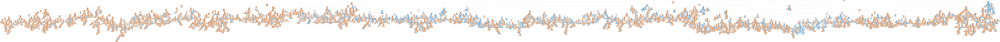

In [40]:
feature_name=list(X.columns)
class_name = list(y_train)
# create a dot_file which stores the tree structure
dot_data = export_graphviz(dt_gs.best_estimator_ , rounded = True, filled = True)
# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)
#graph.write_png("tree.png")
# Show graph
Image(graph.create_png())

In [56]:
text_representation = tree.export_text(dt_gs.best_estimator_)
print(text_representation)
with open("decistion_tree.log", "w") as fout:
    fout.write(text_representation)

|--- feature_8 <= 1.50
|   |--- feature_13 <= -0.87
|   |   |--- feature_13 <= -0.91
|   |   |   |--- feature_2 <= 0.50
|   |   |   |   |--- feature_0 <= 0.50
|   |   |   |   |   |--- feature_17 <= 0.53
|   |   |   |   |   |   |--- feature_13 <= -0.96
|   |   |   |   |   |   |   |--- feature_5 <= 0.50
|   |   |   |   |   |   |   |   |--- feature_1 <= 2.50
|   |   |   |   |   |   |   |   |   |--- feature_7 <= 9.00
|   |   |   |   |   |   |   |   |   |   |--- feature_7 <= 2.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 16
|   |   |   |   |   |   |   |   |   |   |--- feature_7 >  2.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 13
|   |   |   |   |   |   |   |   |   |--- feature_7 >  9.00
|   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |--- feature_1 >  2.50
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |--- feature_5 >  0.50
|   |   |   |   |   |   |   |   

In [58]:
def ROC(y_test, y_prob):
    
    false_positive_rate, true_positive_rate, threshold = roc_curve(y_test, y_prob)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    
    plt.figure(figsize = (10,10))
    plt.title('Receiver Operating Characteristic')
    plt.plot(false_positive_rate, true_positive_rate,\
         color = 'red', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1], linestyle = '--')
    plt.axis('tight')
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')

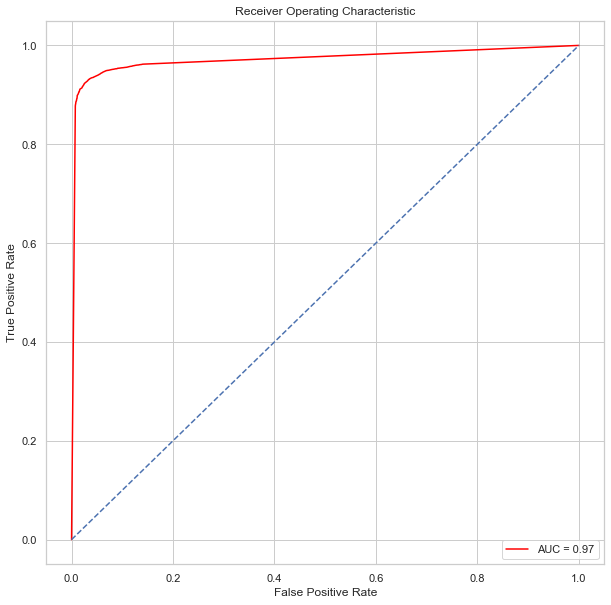

In [98]:
y_prob_DT = dt_gs.predict_proba(X_test)[:,1]
ROC(y_test, y_prob)

In [61]:
# Scoring 
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold
print(f'Best Training Accuracy: {dt.score(X_train, y_train)}')
print(f'Best Testing Accuracy: {dt.score(X_test, y_test)}')
print(f'Cross-val-score: {cross_val_score(dt.best_estimator_, X, y, cv=StratifiedKFold(shuffle=True)).mean()}')

Best Training Accuracy: 0.9741011738695583
Best Testing Accuracy: 0.9555312249968417
Cross-val-score: 0.9554206039408006


In [62]:
y_pred = dt_gs.predict(X_test)
print('Accuracy Score: {}\n\nConfusion Matrix:\n {}'
      .format(accuracy_score(y_test,y_pred), confusion_matrix(y_test,y_pred)))

Accuracy Score: 0.9555312249968417

Confusion Matrix:
 [[14593   382]
 [  674  8098]]


### Ramdon Forest

In [72]:
import sklearn
import matplotlib.pyplot as plt


from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, confusion_matrix, auc
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold
pd.set_option('display.max_columns', None)


In [75]:
#%%
'''Import cleaned dataset'''
data = pd.read_csv('cleaned_data.csv')
#%%
'''Check missing values'''
# # data = data.dropna()
# data
na_summary = data.isna().sum()
#%%
'''Train set and test set split'''
train_set, test_set = \
    train_test_split(data, test_size= 0.2,random_state=208)

#%%
'''Reindex rows'''
train_set = train_set.reset_index(drop = True)
test_set = test_set.reset_index(drop = True)

The TPR is  96.24373605086959


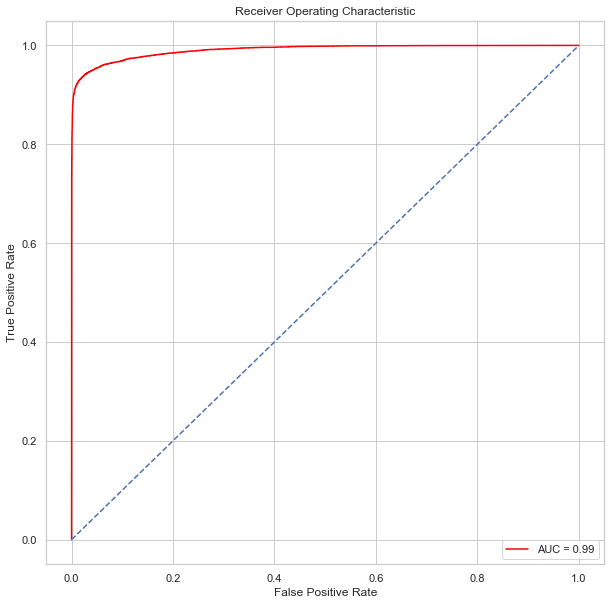

In [78]:
# %%
# pca = PCA(n_components=3)
# pca.fit(train_set)
# %%
'''Random Forest Model'''
train_features = train_set.drop(columns = ['is_canceled'])
train_labels = train_set['is_canceled']
test_features = test_set.drop(columns = ['is_canceled'])
test_labels = test_set['is_canceled']
#%%
'''Randon Forest Fitting'''

# rf = RandomForestRegressor(n_estimators = 1500,max_depth=15,min_samples_leaf=4,\
#     min_samples_split=25,max_features=0.9, random_state = 208)

rf = RandomForestRegressor(n_estimators = 1500, max_depth = None, 
min_samples_split = 20,\
    min_samples_leaf = 5,random_state= 208)
rf.fit(train_features, train_labels)

predictions = rf.predict(test_features)

predictions = pd.DataFrame(predictions)

#%%
predictions_df = predictions.copy()
predictions_df[predictions_df<0.5] = 0
predictions_df[predictions_df>=0.5] = 1


cm_rf = confusion_matrix(test_labels,predictions_df)
cm_rf = pd.DataFrame(cm_rf)

accuracy_rf = (cm_rf.iloc[0,0]+cm_rf.iloc[1,1])/(cm_rf.sum().sum())*100
print('The TPR is ',accuracy_rf)
# importance_rf = pd.DataFrame(rf.feature_importances_)
#%%
'''ROC Curve'''
def ROC(y_test, y_prob):
    
    false_positive_rate, true_positive_rate, threshold = roc_curve(y_test, y_prob)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    
    plt.figure(figsize = (10,10))
    plt.title('Receiver Operating Characteristic')
    plt.plot(false_positive_rate, true_positive_rate,\
         color = 'red', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1], linestyle = '--')
    plt.axis('tight')
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')

ROC(test_labels,predictions)


#%%
# '''Hyperparameters' tuning'''
# start_time = time.time()

# n_estimators = \
#     [int(x) for x in np.linspace(start = 1000, stop = 1500, num = 5)]
# max_features = [x for x in np.linspace(0, 1, num = 5)]
# # max_depth = [int(x) for x in np.linspace(1, 18, num = 18)]
# max_depth = [None]
# min_samples_split = range(20,30)
# min_samples_leaf = range(1,5)
# # # bootstrap = [True, False]

# param_grid = {'n_estimators': n_estimators,
#                'max_features': max_features,
#                'max_depth': max_depth,
#                'min_samples_split':min_samples_split,
#                'min_samples_leaf': min_samples_leaf,}
# # # # %%
# rf = RandomForestRegressor(random_state= 208)
# grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
#                           cv = 3)
# # # # CV: Number of folds
# # # # n_iter: Number of iteration for trial
# # # #%%
# # # '''Fit the model on the trianing set to get best combination'''
# rf_gs = grid_search.fit(train_features, train_labels)


# # # # %%
# # end_time = time.time()
# # print('Time consumed for parameters tuning is {:.4f}'.format(end_time - start_time))
# # #%%
# # rf_gs.best_params_

# #%%
# rf_gs.best_params_

# #%%
# rf_gs.score(train_features,train_labels)
# rf_gs.score(test_features,test_labels)

In [79]:
rf.feature_importances_

array([3.90684139e-03, 3.70010921e-03, 5.34464425e-02, 7.22294925e-02,
       2.66181467e-03, 5.10927245e-04, 2.41805824e-03, 3.38037598e-03,
       2.60063755e-01, 1.30309754e-02, 2.51456552e-02, 1.00996182e-01,
       5.40387724e-02, 6.35525462e-02, 1.50786725e-01, 3.42678351e-02,
       4.19362461e-03, 9.84718671e-03, 2.25904798e-03, 6.29587172e-04,
       2.23899437e-05, 2.26438947e-02, 4.66999978e-03, 9.20734784e-03,
       4.47822509e-04, 2.34591120e-02, 2.73860062e-02, 5.10974727e-02])

In [82]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
import shap
from matplotlib import pyplot as plt

ModuleNotFoundError: No module named 'shap'

In [93]:
feature_names = train_features.columns

In [ ]:
train_features, train_labels

In [95]:
train_features.columns

Index(['hotel', 'meal', 'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'reserved_room_type', 'assigned_room_type',
       'deposit_type', 'customer_type', 'year', 'month', 'day', 'lead_time',
       'arrival_date_week_number', 'arrival_date_day_of_month',
       'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children',
       'babies', 'previous_cancellations', 'previous_bookings_not_canceled',
       'booking_changes', 'days_in_waiting_list', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests'],
      dtype='object')

<BarContainer object of 28 artists>

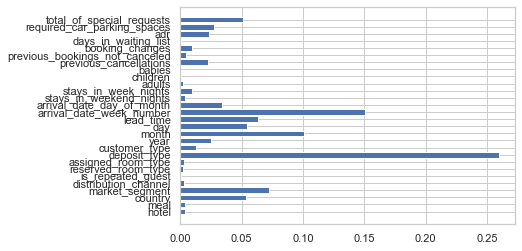

In [96]:
plt.barh(feature_names, rf.feature_importances_)

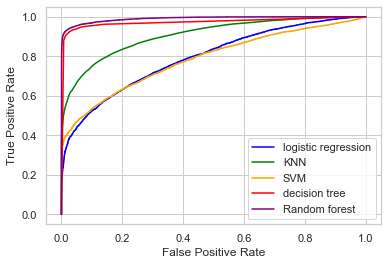

In [99]:
from sklearn.metrics import roc_curve

fpr_LR, tpr_LR, _ = roc_curve(y_test,  y_prob_LR[:,1])
fpr_KN, tpr_KN, _ = roc_curve(y_test,  y_prob_KN[:,1])
fpr_SVM, tpr_SVM, _ = roc_curve(y_test,  y_prob_SVM[:,1])
fpr_DT, tpr_DT, _ = roc_curve(y_test,  y_prob_DT)
fpr_RF, tpr_RF, _ = roc_curve(test_labels,predictions)

#import matplotlib.patches as mpatches

#blue_patch = mpatches.Patch(color='blue', label='The blue data')
#green_patch = mpatches.Patch(color='red', label='The red data')
#orange_patch = mpatches.Patch(color='red', label='The red data')
#red_patch = mpatches.Patch(color='red', label='The red data')

#plt.legend(handles=[red_patch, blue_patch])

#create ROC curve
pLR = plt.plot(fpr_LR,tpr_LR, color = 'blue', label='logistic regression')
pKN = plt.plot(fpr_KN,tpr_KN, color = 'green', label='KNN')
pSVM = plt.plot(fpr_SVM,tpr_SVM, color = 'orange', label='SVM')
pDT = plt.plot(fpr_DT,tpr_DT, color = 'red', label='decision tree')
pRF = plt.plot(fpr_RF,tpr_RF, color = 'purple', label='Random forest')
labels = ['logistic regression', 'KNN','SVM', 'decision tree', 'Random forest']
plt.legend(labels)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()